In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from plotly.offline import iplot
import plotly as py
import plotly.express as px
import plotly.tools as tls
import cufflinks as cf

In [2]:
hospital=pd.read_csv("hospital_appointment.csv")

In [3]:
hospital.head(2)

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status
0,1,5642903,F,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,0,1,0,0,0,0,No
1,2,5642503,M,2016-04-29T16:08:27Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,0,0,0,0,0,No


In [5]:
hospital["Status"].unique()

array(['No', 'Yes'], dtype=object)

In [6]:
hospital.count()

PatientId         110527
AppointmentID     110527
Gender            110527
ScheduledDay      110527
AppointmentDay    110527
Age               110527
Neighbourhood     110527
Scholarship       110527
Hipertension      110527
Diabetes          110527
Alcoholism        110527
Handcap           110527
SMS_received      110527
Status            110527
dtype: int64

# REPLACES M FROM MALE AND F FROM FEMALE

In [8]:
hospital["Gender"].replace("M","Male",inplace=True)
hospital["Gender"].replace("F","Female",inplace=True)

C:\Users\hp\AppData\Local\Temp\ipykernel_81136\2177430476.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



C:\Users\hp\AppData\Local\Temp\ipykernel_81136\2177430476.py:2: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)'

In [9]:
hospital.head(2)

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status
0,1,5642903,Female,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,0,1,0,0,0,0,No
1,2,5642503,Male,2016-04-29T16:08:27Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,0,0,0,0,0,No


# BAR CHART FOR CHECKING TOTAL COUNT OF MALE AND FEMALE AND PIE CHART FOR CHECKING MALE AND FEMALE RATIO

In [10]:
Total_status=hospital[["Gender","Status"]].groupby("Gender").count()
Total_status

,Status
Gender,
Female,71840
Male,38687


In [11]:
size=Total_status["Status"]
label=Total_status.index

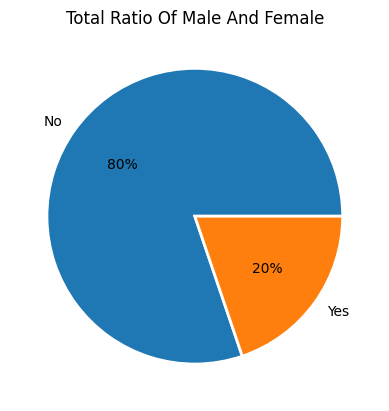

ACCORDING TO THE UPPER CHART FROM THE TOTAL DATA THERE IS (65%) CONTRIBUTION OF FEMALES AND (35%) CONTRTIBUTION OF MALES


In [132]:
plt.pie(size,labels=label,autopct="%1.f%%",wedgeprops={"linewidth":2,"edgecolor":"white"})
plt.title("Total Ratio Of Male And Female")
plt.show()
print("ACCORDING TO THE UPPER CHART FROM THE TOTAL DATA THERE IS (65%) CONTRIBUTION OF FEMALES AND (35%) CONTRTIBUTION OF MALES")

In [13]:
gender1=hospital[["Gender","PatientId"]].groupby("Gender").count()
gender1

,PatientId
Gender,
Female,71840
Male,38687


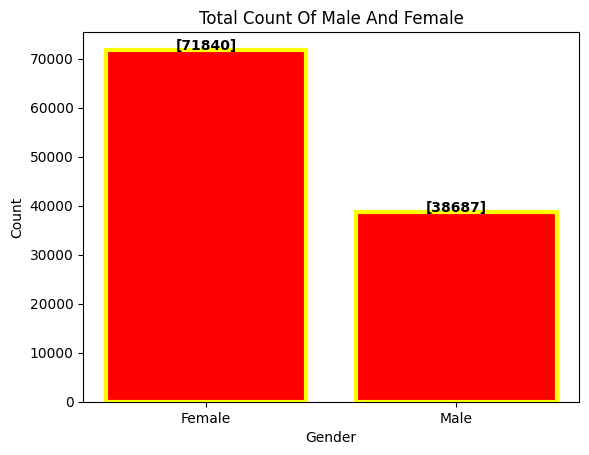

In [158]:
plt.bar(x=gender1.index,height=gender1.PatientId,color="red",edgecolor="yellow",linewidth=3)
for i ,v in enumerate(gender1.values):
    plt.text(gender1.index[i],gender1.values[i],str(v),ha="center",weight="bold")
plt.title("Total Count Of Male And Female")
plt.xlabel("Gender")
plt.ylabel("Count")
plt.show()

# TOTAL PERCENTAGE OF PEOPLE COMING OR NOT (YES OR NO) TOTAL CONTRIBUTION

In [15]:
Total_Y_N=hospital[["Status","PatientId"]].groupby("Status").sum()
Total_Y_N

,PatientId
Status,
No,4899065005
Yes,1209099123


In [16]:
size=Total_Y_N["PatientId"]
label=Total_Y_N.index

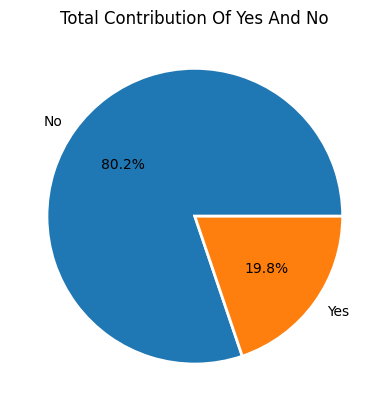

THE UPPER PIRE CHART SHOWS THAT FROM 100% (BOTH MALES AND FEMALES) OF DATA ONLY (19.8%) PATIENTS ARE COMING AT THE APPOINTMENT AND REST (80.2%) ARE NOT COMING AT THE APPOINTMENT AFTER THE BOOKING 


In [131]:
plt.pie(size,labels=label,autopct="%1.1f%%",wedgeprops={"linewidth":2,"edgecolor":"white"})
plt.title("Total Contribution Of Yes And No")
plt.show()
print("THE UPPER PIRE CHART SHOWS THAT FROM 100% (BOTH MALES AND FEMALES) OF DATA ONLY (19.8%) PATIENTS ARE COMING AT THE APPOINTMENT AND REST (80.2%) ARE NOT COMING AT THE APPOINTMENT AFTER THE BOOKING ")

# Made a new column for Months and replaced months number by months name

In [19]:
hospital["Month"]=pd.to_datetime(hospital["ScheduledDay"]).dt.month

In [20]:
hospital.head(2)

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status,Month
0,1,5642903,Female,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,0,1,0,0,0,0,No,4
1,2,5642503,Male,2016-04-29T16:08:27Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,0,0,0,0,0,No,4


In [21]:
hospital["Month"].unique() # Months available

array([ 4,  3,  2,  1,  5, 11, 12,  6])

In [23]:
hospital["Month"].replace(1,"Jan",inplace=True)
hospital["Month"].replace(2,"Feb",inplace=True)
hospital["Month"].replace(3,"Mar",inplace=True)
hospital["Month"].replace(4,"Apr",inplace=True)
hospital["Month"].replace(5,"May",inplace=True)
hospital["Month"].replace(6,"Jun",inplace=True)
hospital["Month"].replace(11,"Nov",inplace=True)
hospital["Month"].replace(12,"Dec",inplace=True)

In [24]:
hospital.head(2)

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status,Month
0,1,5642903,Female,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,0,1,0,0,0,0,No,Apr
1,2,5642503,Male,2016-04-29T16:08:27Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,0,0,0,0,0,No,Apr


# Month wise total analysis of patient availed (Yes) the appointment  and (No) Not availed the appointment

In [25]:
hospital_Yes=hospital[hospital["Status"]=="Yes"]

In [26]:
hospital_Yes.head(2)

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status,Month
6,7,5630279,Female,2016-04-27T15:05:12Z,2016-04-29T00:00:00Z,23,GOIABEIRAS,0,0,0,0,0,0,Yes,Apr
7,8,5630575,Female,2016-04-27T15:39:58Z,2016-04-29T00:00:00Z,39,GOIABEIRAS,0,0,0,0,0,0,Yes,Apr


In [27]:
hospital_Yes_grp=hospital_Yes[["Status","Month"]].groupby("Month").count()

In [28]:
hospital_Yes_grp

,Status
Month,
Apr,7849
Dec,19
Feb,82
Jan,18
Jun,1386
Mar,1196
May,11769


In [29]:
hospital_No=hospital[hospital["Status"]=="No"]
hospital_No.head(2)

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status,Month
0,1,5642903,Female,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,0,1,0,0,0,0,No,Apr
1,2,5642503,Male,2016-04-29T16:08:27Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,0,0,0,0,0,No,Apr


In [30]:
hospital_No_grp=hospital_No[["Status","Month"]].groupby("Month").count()

In [31]:
hospital_No_grp

,Status
Month,
Apr,17490
Dec,42
Feb,199
Jan,42
Jun,12364
Mar,2418
May,55652
Nov,1


# VIUALISATION OF YES AND NO APPOINTMENTS TOTAL MONTH WISE

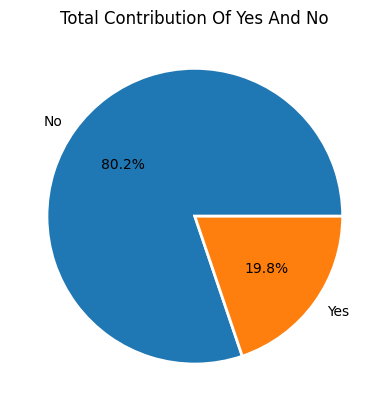

THE UPPER PIRE CHART SHOWS THAT FROM 100% (BOTH MALES AND FEMALES) OF DATA ONLY (19.8%) PATIENTS ARE COMING AT THE APPOINTMENT AND REST (80.2%) ARE NOT COMING AT THE APPOINTMENT AFTER THE BOOKING 


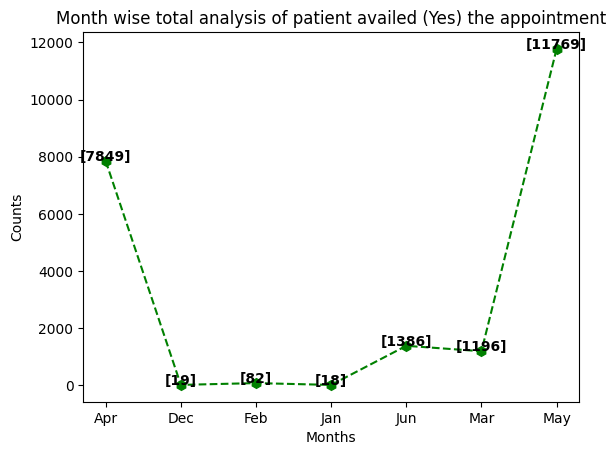

THE CHARTS SHOWS MONTH WISE RATIO OF BOTH MALES AND FEMALES AVAILING THE APPOINTMENT (YES)


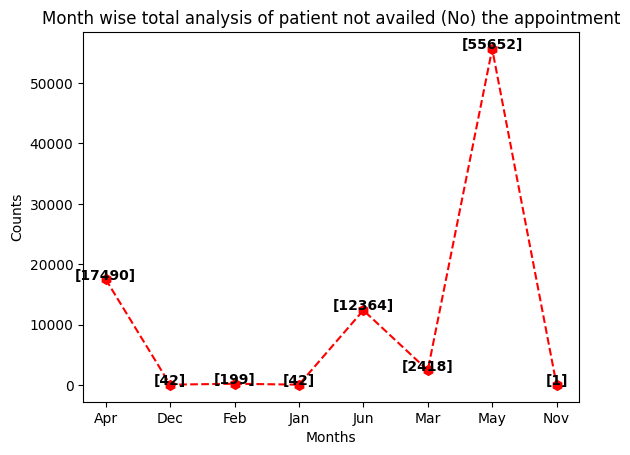

THE CHARTS SHOWS MONTH WISE RATIO OF BOTH MALES AND FEMALES NOT AVAILED THE APPOINTMENT (NO)


In [169]:
plt.pie(size,labels=label,autopct="%1.1f%%",wedgeprops={"linewidth":2,"edgecolor":"white"})
plt.title("Total Contribution Of Yes And No")
plt.show()
print("THE UPPER PIRE CHART SHOWS THAT FROM 100% (BOTH MALES AND FEMALES) OF DATA ONLY (19.8%) PATIENTS ARE COMING AT THE APPOINTMENT AND REST (80.2%) ARE NOT COMING AT THE APPOINTMENT AFTER THE BOOKING ")
plt.plot(hospital_Yes_grp.index,hospital_Yes_grp["Status"],"h--",color="green",markersize=7)
for i, value in enumerate(hospital_Yes_grp.values):
    plt.text(hospital_Yes_grp.index[i],hospital_Yes_grp.values[i],str(value),ha="center",weight="bold")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.title("Month wise total analysis of patient availed (Yes) the appointment")
plt.show()
print("THE CHARTS SHOWS MONTH WISE RATIO OF BOTH MALES AND FEMALES AVAILING THE APPOINTMENT (YES)")
plt.plot(hospital_No_grp.index,hospital_No_grp["Status"],"h--",color="red",markersize=7)
for i, value in enumerate(hospital_No_grp.values):
    plt.text(hospital_No_grp.index[i],hospital_No_grp.values[i],str(value),ha="center",weight="bold")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.title("Month wise total analysis of patient not availed (No) the appointment")
plt.show()
print("THE CHARTS SHOWS MONTH WISE RATIO OF BOTH MALES AND FEMALES NOT AVAILED THE APPOINTMENT (NO)")

# Age wise analysis of patient count for checking the average age of the patient

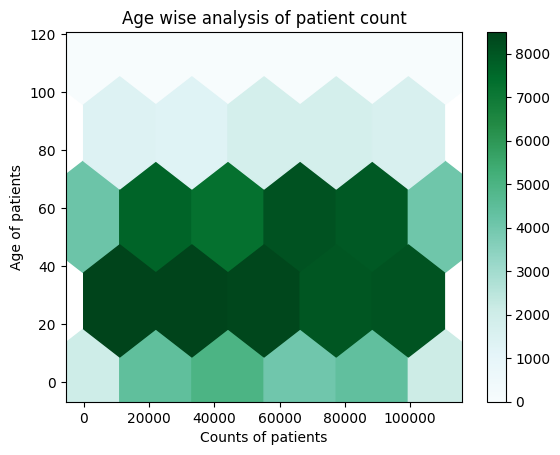

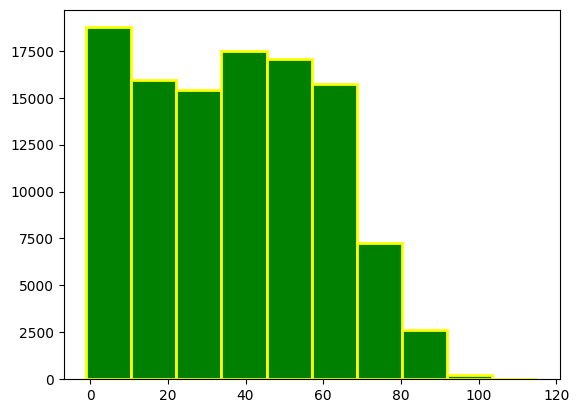

In [170]:
hospital.plot.hexbin(x="PatientId",y="Age",gridsize=5)
plt.xlabel("Counts of patients")
plt.ylabel("Age of patients")
plt.title("Age wise analysis of patient count")
plt.show()
plt.hist(hospital["Age"],bins=10,color="green",edgecolor="yellow",linewidth=2)
plt.show()

# DATA FILTERING TO GET ONLY MALES WITH (STATUS) YES AND (STATUS) NO

In [37]:
total_Male=hospital[hospital["Gender"]=="Male"] # total  data of males who aviled the appointment (yes) and not availed the appintment(No)

In [38]:
total_Male.head(2)

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status,Month
1,2,5642503,Male,2016-04-29T16:08:27Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,0,0,0,0,0,No,Apr
11,12,5620163,Male,2016-04-26T08:44:12Z,2016-04-29T00:00:00Z,29,NOVA PALESTINA,0,0,0,0,0,1,Yes,Apr


In [39]:
total_Male_grp=total_Male[["Gender","Status"]].groupby("Status").count()

In [40]:
total_Male_grp # Male data with yes and no

,Gender
Status,
No,30962
Yes,7725


In [41]:
Male_yes=total_Male[total_Male["Status"]=="Yes"] # MAle data with only yes (Who availed the appointment)

In [42]:
Male_yes.head(2)

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status,Month
11,12,5620163,Male,2016-04-26T08:44:12Z,2016-04-29T00:00:00Z,29,NOVA PALESTINA,0,0,0,0,0,1,Yes,Apr
22,23,5616091,Male,2016-04-25T13:29:16Z,2016-04-29T00:00:00Z,13,CONQUISTA,0,0,0,0,0,1,Yes,Apr


In [43]:
hospital_grp_male_yes=Male_yes[["Status","Month"]].groupby("Month").count()
hospital_grp_male_yes # groupby for getting month wise count of yes data 

,Status
Month,
Apr,2637
Dec,8
Feb,23
Jan,5
Jun,522
Mar,418
May,4112


In [44]:
Male_no=total_Male[total_Male["Status"]=="No"] # Male data who have not availed the appointment (No)

In [45]:
Male_no.head(2)

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status,Month
1,2,5642503,Male,2016-04-29T16:08:27Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,0,0,0,0,0,No,Apr
13,14,5636249,Male,2016-04-28T14:52:07Z,2016-04-29T00:00:00Z,28,NOVA PALESTINA,0,0,0,0,0,0,No,Apr


In [46]:
hospital_grp_male_no=Male_no[["Status","Month"]].groupby("Month").count() # groupby for getting data of males who have not availed the appointment month wise
hospital_grp_male_no

,Status
Month,
Apr,5864
Dec,9
Feb,87
Jan,15
Jun,4343
Mar,774
May,19870


# VISUALISATION OF TOTAL % OF YES AND NO OF MALES WITH MONTH WISE ANALYIS

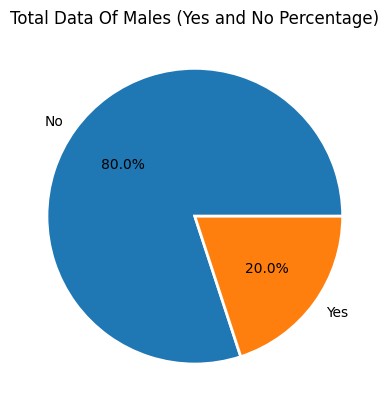

THE UPPER CHAT SHOWS THAT FROM THE TOTAL NUMBER OF MALES ONLY (20.0%) MALES AVAILED THE APPOINTMENT AND REST (80%) MALES DID NOT AVAILED THE APPOINTMENT AFTER BOOKING


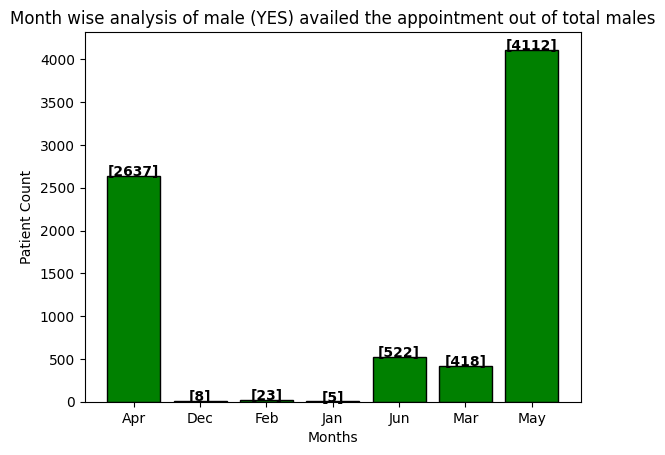

MALES (YES) DATA (20.0%) WHO AVAILED THE APPOINTMENT AND THEIR MONTH WISE ANALYSIS


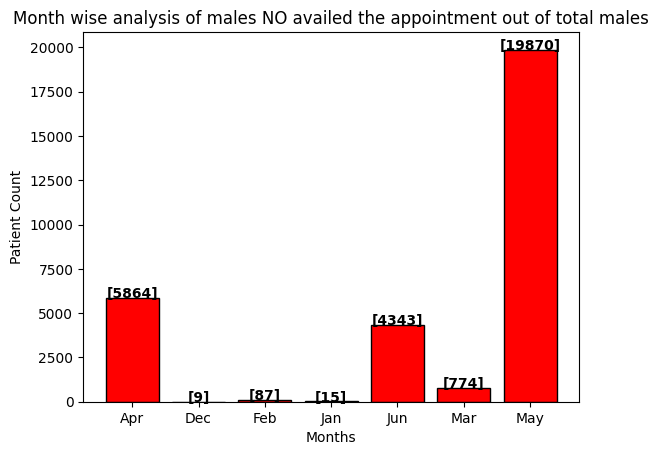

MALES (NO) DATA (80.0%) NOT AVAILED THE APPOINTMENT AND THEIR MONTH WISE ANALYSIS


In [155]:
plt.pie(total_Male_grp["Gender"],labels=total_Male_grp.index,autopct="%1.1f%%",wedgeprops={"linewidth":2,"edgecolor":"white"})
plt.title("Total Data Of Males (Yes and No Percentage)")
plt.show()
print("THE UPPER CHAT SHOWS THAT FROM THE TOTAL NUMBER OF MALES ONLY (20.0%) MALES AVAILED THE APPOINTMENT AND REST (80%) MALES DID NOT AVAILED THE APPOINTMENT AFTER BOOKING")
plt.bar(x=hospital_grp_male_yes.index,height=hospital_grp_male_yes.Status,color="green",edgecolor="black",linewidth=1)
for i, value in enumerate(hospital_grp_male_yes.values):
    plt.text(hospital_grp_male_yes.index[i],hospital_grp_male_yes.values[i],str(value),ha="center",weight="bold")
plt.title("Month wise analysis of male (YES) availed the appointment out of total males")
plt.xlabel("Months")
plt.ylabel("Patient Count")
plt.show()
print("MALES (YES) DATA (20.0%) WHO AVAILED THE APPOINTMENT AND THEIR MONTH WISE ANALYSIS")
plt.bar(x=hospital_grp_male_no.index,height=hospital_grp_male_no.Status,color="red",edgecolor="black",linewidth=1)
for i, value in enumerate(hospital_grp_male_no.values):
    plt.text(hospital_grp_male_no.index[i],hospital_grp_male_no.values[i],str(value),ha="center",weight="bold")
plt.title("Month wise analysis of males NO availed the appointment out of total males")
plt.xlabel("Months")
plt.ylabel("Patient Count")
plt.show()
hospital_grp_male_no.sum()
print("MALES (NO) DATA (80.0%) NOT AVAILED THE APPOINTMENT AND THEIR MONTH WISE ANALYSIS")

# DATA FILTERING TO GET ONLY FEMALES WITH (STATUS) YES AND (STATUS) NO

In [53]:
total_Female=hospital[hospital["Gender"]=="Female"]
total_Female

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status,Month
0,1,5642903,Female,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,0,1,0,0,0,0,No,Apr
2,3,5642549,Female,2016-04-29T16:19:04Z,2016-04-29T00:00:00Z,62,MATA DA PRAIA,0,0,0,0,0,0,No,Apr
3,4,5642828,Female,2016-04-29T17:29:31Z,2016-04-29T00:00:00Z,8,PONTAL DE CAMBURI,0,0,0,0,0,0,No,Apr
4,5,5642494,Female,2016-04-29T16:07:23Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,1,1,0,0,0,No,Apr
5,6,5626772,Female,2016-04-27T08:36:51Z,2016-04-29T00:00:00Z,76,REPÚBLICA,0,1,0,0,0,0,No,Apr
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110522,110523,5651768,Female,2016-05-03T09:15:35Z,2016-06-07T00:00:00Z,56,MARIA ORTIZ,0,0,0,0,0,1,No,May
110523,110524,5650093,Female,2016-05-03T07:27:33Z,2016-06-07T00:00:00Z,51,MARIA ORTIZ,0,0,0,0,0,1,No,May
110524,110525,5630692,Female,2016-04-27T16:03:52Z,2016-06-07T00:00:00Z,21,MARIA ORTIZ,0,0,0,0,0,1,No,Apr
110525,110526,5630323,Female,2016-04-27T15:09:23Z,2016-06-07T00:00:00Z,38,MARIA ORTIZ,0,0,0,0,0,1,No,Apr


In [54]:
total_Female_grp=total_Female[["Gender","Status"]].groupby("Status").count()
total_Female_grp

,Gender
Status,
No,57246
Yes,14594


In [55]:
Female_yes=total_Female[total_Female["Status"]=="Yes"] # for getting data of females who have availed (yes) the appointment
Female_yes

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status,Month
6,7,5630279,Female,2016-04-27T15:05:12Z,2016-04-29T00:00:00Z,23,GOIABEIRAS,0,0,0,0,0,0,Yes,Apr
7,8,5630575,Female,2016-04-27T15:39:58Z,2016-04-29T00:00:00Z,39,GOIABEIRAS,0,0,0,0,0,0,Yes,Apr
17,18,5633460,Female,2016-04-28T09:28:57Z,2016-04-29T00:00:00Z,40,CONQUISTA,1,0,0,0,0,0,Yes,Apr
20,21,5626083,Female,2016-04-27T07:51:14Z,2016-04-29T00:00:00Z,30,NOVA PALESTINA,0,0,0,0,0,0,Yes,Apr
21,22,5628338,Female,2016-04-27T10:50:45Z,2016-04-29T00:00:00Z,4,CONQUISTA,0,0,0,0,0,0,Yes,Apr
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110479,110480,5638153,Female,2016-04-29T07:45:43Z,2016-06-06T00:00:00Z,34,RESISTÊNCIA,1,0,0,0,0,1,Yes,Apr
110482,110483,5639147,Female,2016-04-29T08:45:44Z,2016-06-06T00:00:00Z,43,RESISTÊNCIA,1,0,0,0,0,1,Yes,Apr
110484,110485,5772155,Female,2016-06-03T14:43:56Z,2016-06-07T00:00:00Z,45,BARRO VERMELHO,0,0,0,0,0,0,Yes,Jun
110496,110497,5779046,Female,2016-06-06T17:35:38Z,2016-06-08T00:00:00Z,37,MARIA ORTIZ,0,1,0,0,0,0,Yes,Jun


In [56]:
hospital_grp_female_yes=Female_yes[["Status","Month"]].groupby("Month").count()
hospital_grp_female_yes

,Status
Month,
Apr,5212
Dec,11
Feb,59
Jan,13
Jun,864
Mar,778
May,7657


In [57]:
Female_No=total_Female[total_Female["Status"]=="No"]
Female_No

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status,Month
0,1,5642903,Female,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,0,1,0,0,0,0,No,Apr
2,3,5642549,Female,2016-04-29T16:19:04Z,2016-04-29T00:00:00Z,62,MATA DA PRAIA,0,0,0,0,0,0,No,Apr
3,4,5642828,Female,2016-04-29T17:29:31Z,2016-04-29T00:00:00Z,8,PONTAL DE CAMBURI,0,0,0,0,0,0,No,Apr
4,5,5642494,Female,2016-04-29T16:07:23Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,1,1,0,0,0,No,Apr
5,6,5626772,Female,2016-04-27T08:36:51Z,2016-04-29T00:00:00Z,76,REPÚBLICA,0,1,0,0,0,0,No,Apr
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110522,110523,5651768,Female,2016-05-03T09:15:35Z,2016-06-07T00:00:00Z,56,MARIA ORTIZ,0,0,0,0,0,1,No,May
110523,110524,5650093,Female,2016-05-03T07:27:33Z,2016-06-07T00:00:00Z,51,MARIA ORTIZ,0,0,0,0,0,1,No,May
110524,110525,5630692,Female,2016-04-27T16:03:52Z,2016-06-07T00:00:00Z,21,MARIA ORTIZ,0,0,0,0,0,1,No,Apr
110525,110526,5630323,Female,2016-04-27T15:09:23Z,2016-06-07T00:00:00Z,38,MARIA ORTIZ,0,0,0,0,0,1,No,Apr


In [58]:
hospital_grp_female_no=Female_No[["Status","Month"]].groupby("Month").count()
hospital_grp_female_no

,Status
Month,
Apr,11626
Dec,33
Feb,112
Jan,27
Jun,8021
Mar,1644
May,35782
Nov,1


# VISUALISATION OF TOTAL % OF YES AND NO OF FEMALES WITH MONTH WISE ANALYIS

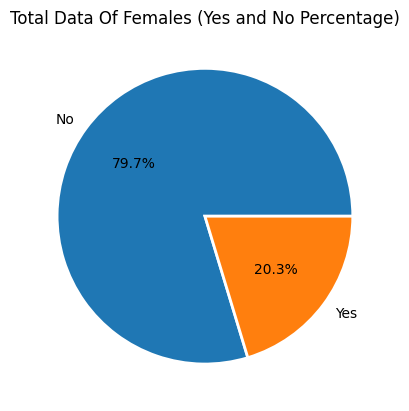

THE UPPER CHAT SHOWS THAT FROM THE TOTAL NUMBER OF FEMALES ONLY (20.3%) FEMALES AVAILED THE APPOINTMENT AND REST (79.7%) FEMALES DID NOT AVAILED THE APPOINTMENT AFTER BOOKING


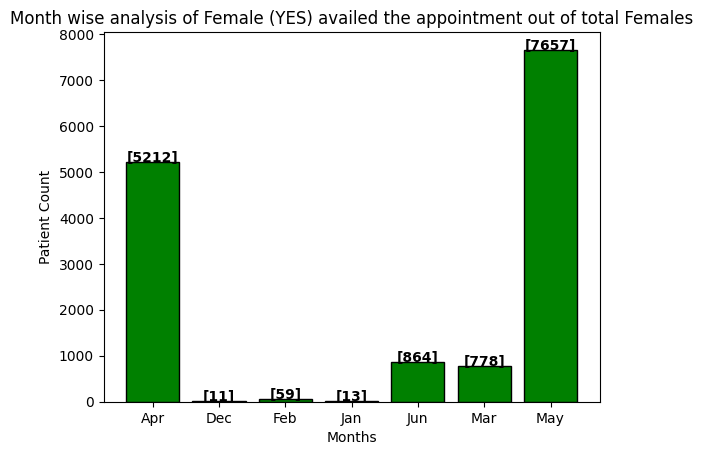

FEMALES (YES) DATA (20.3%) WHO AVAILED THE APPOINTMENT AND THEIR MONTH WISE ANALYSIS


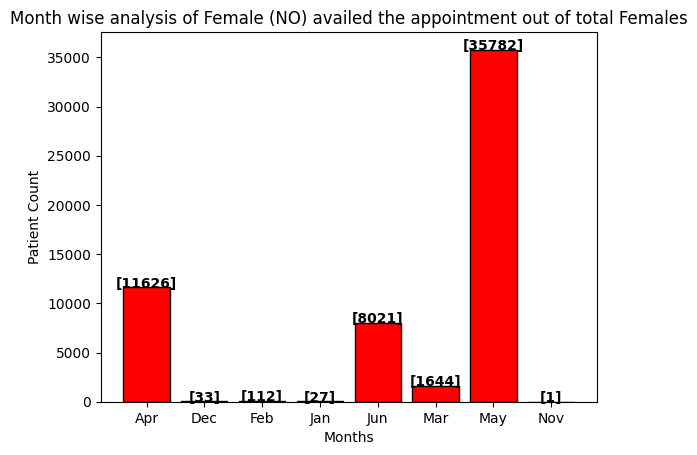

FEMALES (NO) DATA (79.7%) NOT AVAILED THE APPOINTMENT AND THEIR MONTH WISE ANALYSIS


In [154]:
plt.pie(total_Female_grp["Gender"],labels=total_Female_grp.index,autopct="%1.1f%%",wedgeprops={"linewidth":2,"edgecolor":"white"})
plt.title("Total Data Of Females (Yes and No Percentage)")
plt.show()
print("THE UPPER CHAT SHOWS THAT FROM THE TOTAL NUMBER OF FEMALES ONLY (20.3%) FEMALES AVAILED THE APPOINTMENT AND REST (79.7%) FEMALES DID NOT AVAILED THE APPOINTMENT AFTER BOOKING")
plt.bar(x=hospital_grp_female_yes.index,height=hospital_grp_female_yes.Status,color="green",edgecolor="black",linewidth=1)
for i, value in enumerate(hospital_grp_female_yes.values):
    plt.text(hospital_grp_female_yes.index[i],hospital_grp_female_yes.values[i],str(value),ha="center",weight="bold")
plt.title("Month wise analysis of Female (YES) availed the appointment out of total Females")
plt.xlabel("Months")
plt.ylabel("Patient Count")
plt.show()
print("FEMALES (YES) DATA (20.3%) WHO AVAILED THE APPOINTMENT AND THEIR MONTH WISE ANALYSIS")
plt.bar(x=hospital_grp_female_no.index,height=hospital_grp_female_no.Status,color="red",edgecolor="black",linewidth=1)
for i, value in enumerate(hospital_grp_female_no.values):
    plt.text(hospital_grp_female_no.index[i],hospital_grp_female_no.values[i],str(value),ha="center",weight="bold")
plt.title("Month wise analysis of Female (NO) availed the appointment out of total Females")
plt.xlabel("Months")
plt.ylabel("Patient Count")
plt.show()
print("FEMALES (NO) DATA (79.7%) NOT AVAILED THE APPOINTMENT AND THEIR MONTH WISE ANALYSIS")

# CHANGED YES FROM 1 AND NO FROM 0  FOR MAKING PARELLE COORDINATES

In [61]:
hospital["Status"].replace("Yes",1,inplace=True)
hospital["Status"].replace("No",0,inplace=True)

In [62]:
hospital.head(2)

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status,Month
0,1,5642903,Female,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,0,1,0,0,0,0,0,Apr
1,2,5642503,Male,2016-04-29T16:08:27Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,0,0,0,0,0,0,Apr


In [63]:
fig=px.parallel_coordinates(
    hospital[["Age","Status"]],
    color="Status",
    color_continuous_scale=px.colors.diverging.Tealrose,
    color_continuous_midpoint=2
)

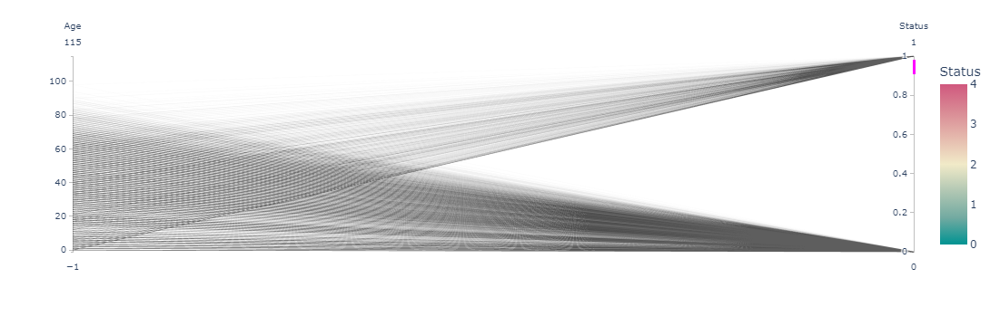

In [64]:
fig.show()

In [65]:
hospital.head(2)

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status,Month
0,1,5642903,Female,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,0,1,0,0,0,0,0,Apr
1,2,5642503,Male,2016-04-29T16:08:27Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,0,0,0,0,0,0,Apr


In [66]:
hospital["Status"].unique()

array([0, 1], dtype=int64)

In [69]:
hospital.columns

Index(['PatientId', 'AppointmentID', 'Gender', 'ScheduledDay',
       'AppointmentDay', 'Age', 'Neighbourhood', 'Scholarship', 'Hipertension',
       'Diabetes', 'Alcoholism', 'Handcap', 'SMS_received', 'Status', 'Month'],
      dtype='object')

In [70]:
hospital["Status"].replace(1,"Yes",inplace=True)
hospital["Status"].replace(0,"No",inplace=True)

In [72]:
hospital["Status"].replace("Yes",1,inplace=True)
hospital["Status"].replace("No",0,inplace=True)

In [73]:
hospital.head(2)

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status,Month
0,1,5642903,Female,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,0,1,0,0,0,0,0,Apr
1,2,5642503,Male,2016-04-29T16:08:27Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,0,0,0,0,0,0,Apr


# REPLACED ALL LAST 5 COLUMNS FOR CHECKING THE COORELATIONS

In [75]:
hospital["Scholarship"].replace(1,"Yes",inplace=True)
hospital["Scholarship"].replace(0,"No",inplace=True)
hospital["Hipertension"].replace(1,"Yes",inplace=True)
hospital["Hipertension"].replace(0,"No",inplace=True)
hospital["Diabetes"].replace(1,"Yes",inplace=True)
hospital["Diabetes"].replace(0,"No",inplace=True)
hospital["Alcoholism"].replace(1,"Yes",inplace=True)
hospital["Alcoholism"].replace(0,"No",inplace=True)
hospital["Handcap"].replace(1,"Yes",inplace=True)
hospital["Handcap"].replace(0,"No",inplace=True)
hospital["SMS_received"].replace(1,"Yes",inplace=True)
hospital["SMS_received"].replace(0,"No",inplace=True)
hospital["Status"].replace(1,"Yes",inplace=True)
hospital["Status"].replace(0,"No",inplace=True)

In [76]:
hospital.head(2)

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status,Month
0,1,5642903,Female,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,No,Yes,No,No,No,No,No,Apr
1,2,5642503,Male,2016-04-29T16:08:27Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,No,No,No,No,No,No,No,Apr


# FINDING OF CHANCES OF YES AND NO WHEN THE SCHOLARSHIP IS GIVEN AND NOT GIVEN

In [77]:
Scholarship_total_yes=hospital[hospital["Scholarship"]=="Yes"]
Scholarship_total_yes

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status,Month
12,13,5634718,Female,2016-04-28T11:33:51Z,2016-04-29T00:00:00Z,22,NOVA PALESTINA,Yes,No,No,No,No,No,No,Apr
17,18,5633460,Female,2016-04-28T09:28:57Z,2016-04-29T00:00:00Z,40,CONQUISTA,Yes,No,No,No,No,No,Yes,Apr
18,19,5621836,Female,2016-04-26T10:54:18Z,2016-04-29T00:00:00Z,30,NOVA PALESTINA,Yes,No,No,No,No,Yes,No,Apr
31,32,5628907,Male,2016-04-27T12:07:14Z,2016-04-29T00:00:00Z,12,NOVA PALESTINA,Yes,No,No,No,No,No,Yes,Apr
33,34,5616921,Female,2016-04-25T15:01:04Z,2016-04-29T00:00:00Z,38,SÃO CRISTÓVÃO,Yes,No,No,No,No,Yes,No,Apr
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110423,110424,5704561,Female,2016-05-16T16:02:09Z,2016-06-08T00:00:00Z,34,RESISTÊNCIA,Yes,No,No,No,No,Yes,No,May
110426,110427,5740289,Male,2016-05-25T15:00:52Z,2016-06-08T00:00:00Z,13,RESISTÊNCIA,Yes,No,No,No,No,Yes,No,May
110473,110474,5779851,Male,2016-06-07T07:19:54Z,2016-06-07T00:00:00Z,2,NOVA PALESTINA,Yes,No,No,No,No,No,No,Jun
110479,110480,5638153,Female,2016-04-29T07:45:43Z,2016-06-06T00:00:00Z,34,RESISTÊNCIA,Yes,No,No,No,No,Yes,Yes,Apr


In [78]:
total_yes_no_scholarship=Scholarship_total_yes[["Status","PatientId"]].groupby("Status").count()
total_yes_no_scholarship

,PatientId
Status,
No,8283
Yes,2578


In [79]:
size1=total_yes_no_scholarship["PatientId"]
label1=total_yes_no_scholarship.index

In [81]:
Scholarship_total_no=hospital[hospital["Scholarship"]=="No"]

In [82]:
Scholarship_total_no.head(2)

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status,Month
0,1,5642903,Female,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,No,Yes,No,No,No,No,No,Apr
1,2,5642503,Male,2016-04-29T16:08:27Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,No,No,No,No,No,No,No,Apr


In [83]:
total_yes_no_scholarship_=Scholarship_total_no[["Status","PatientId"]].groupby("Status").count()
total_yes_no_scholarship_

,PatientId
Status,
No,79925
Yes,19741


In [84]:
size2=total_yes_no_scholarship_["PatientId"]
label2=total_yes_no_scholarship_.index

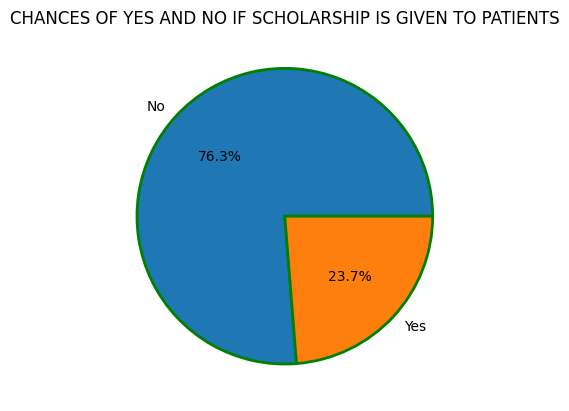

THE ABOVE CHART SHOWS THAT IF THE SCHOLARSHIP GIVEN TO THE PATIENTS , SO THERE ARE (23.7%) CHANCE THAT THE PATIENT WILL AVAIL (YES) THE APPOINTMENT AND (76.3%) CHANCES OF NOT GETTING APPOINTMENT AVAILED


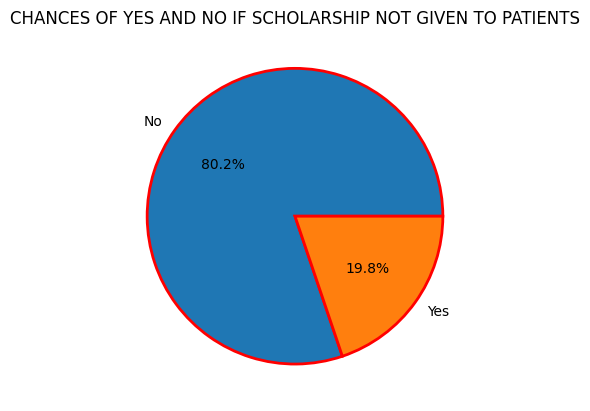

THE ABOVE CHART SHOWS THAT IF THE SCHOLARSHIP NOT GIVEN TO THE PATIENTS , SO THERE ARE (19.8%) CHANCE THAT THE PATIENT WILL AVAIL (YES) THE APPOINTMENT AND (80.2%) CHANCES OF NOT GETTING APPOINTMENT AVAILED


In [125]:
plt.pie(size1,labels=label1,autopct="%1.1f%%",wedgeprops={"linewidth":2,"edgecolor":"green"})
plt.title("CHANCES OF YES AND NO IF SCHOLARSHIP IS GIVEN TO PATIENTS")
plt.show()
print("THE ABOVE CHART SHOWS THAT IF THE SCHOLARSHIP GIVEN TO THE PATIENTS , SO THERE ARE (23.7%) CHANCE THAT THE PATIENT WILL AVAIL (YES) THE APPOINTMENT AND (76.3%) CHANCES OF NOT GETTING APPOINTMENT AVAILED")
plt.pie(size2,labels=label2,autopct="%1.1f%%",wedgeprops={"linewidth":2,"edgecolor":"red"})
plt.title("CHANCES OF YES AND NO IF SCHOLARSHIP NOT GIVEN TO PATIENTS")
plt.show()
print("THE ABOVE CHART SHOWS THAT IF THE SCHOLARSHIP NOT GIVEN TO THE PATIENTS , SO THERE ARE (19.8%) CHANCE THAT THE PATIENT WILL AVAIL (YES) THE APPOINTMENT AND (80.2%) CHANCES OF NOT GETTING APPOINTMENT AVAILED")

# FINDING THE CHANCES OF YES AND NO WHEN PATIENTS HAVING HIPERTENTION 

In [86]:
Hipertension_total_yes=hospital[hospital["Hipertension"]=="Yes"]

In [87]:
Hipertension_total_yes.head(2)

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status,Month
0,1,5642903,Female,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,No,Yes,No,No,No,No,No,Apr
4,5,5642494,Female,2016-04-29T16:07:23Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,No,Yes,Yes,No,No,No,No,Apr


In [88]:
Hipertension_total_yes_grp=Hipertension_total_yes[["Status","PatientId"]].groupby("Status").count()
Hipertension_total_yes_grp

,PatientId
Status,
No,18029
Yes,3772


In [89]:
size3=Hipertension_total_yes_grp["PatientId"]
label3=Hipertension_total_yes_grp.index

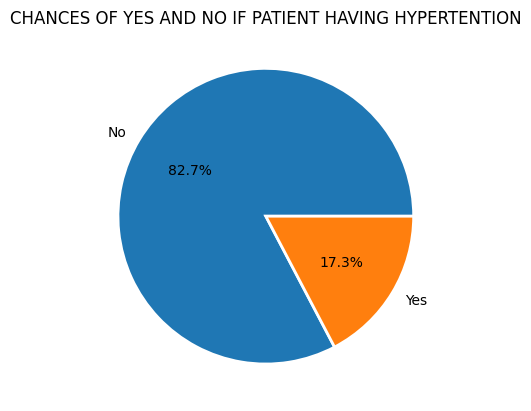

THE ABOVE CHART SHOWS THAT IF PATIENT HAVING HYPERTENTION, SO THERE ARE (17.3%) CHANCE THAT THE PATIENT WILL AVAIL (YES) THE APPOINTMENT AND (82.7%) CHANCES OF NOT GETTING APPOINTMENT AVAILED


In [123]:
plt.pie(size3,labels=label3,autopct="%1.1f%%",wedgeprops={"linewidth":2,"edgecolor":"white"})
plt.title("CHANCES OF YES AND NO IF PATIENT HAVING HYPERTENTION")
plt.show()
print("THE ABOVE CHART SHOWS THAT IF PATIENT HAVING HYPERTENTION, SO THERE ARE (17.3%) CHANCE THAT THE PATIENT WILL AVAIL (YES) THE APPOINTMENT AND (82.7%) CHANCES OF NOT GETTING APPOINTMENT AVAILED")

# FINDING THE CHANCES OF YES AND NO WHEN PATIENTS HAVING DIABETES 

In [91]:
Diabetes_total_yes=hospital[hospital["Diabetes"]=="Yes"]

In [92]:
Diabetes_total_yes.head(2)

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status,Month
4,5,5642494,Female,2016-04-29T16:07:23Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,No,Yes,Yes,No,No,No,No,Apr
36,37,5637975,Female,2016-04-29T07:35:19Z,2016-04-29T00:00:00Z,63,SÃO CRISTÓVÃO,No,Yes,Yes,No,No,No,No,Apr


In [93]:
Diabetes_total_yes_grp=Diabetes_total_yes[["Status","PatientId"]].groupby("Status").count()

In [94]:
Diabetes_total_yes_grp

,PatientId
Status,
No,6513
Yes,1430


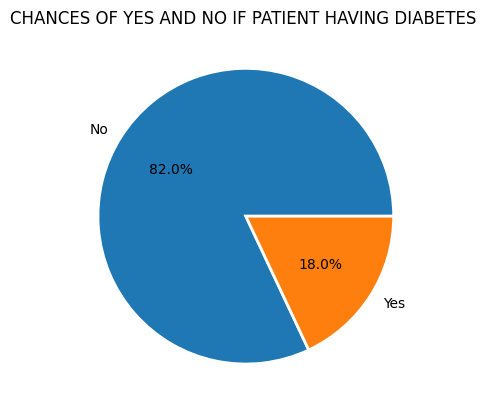

THE ABOVE CHART SHOWS THAT IF PATIENT HAVING DIABETES, SO THERE ARE (18.0%) CHANCE THAT THE PATIENT WILL AVAIL (YES) THE APPOINTMENT AND (82.0%) CHANCES OF NOT GETTING APPOINTMENT AVAILED


In [122]:
plt.pie(Diabetes_total_yes_grp["PatientId"],labels=Diabetes_total_yes_grp.index,autopct="%1.1f%%",wedgeprops={"linewidth":2,"edgecolor":"white"})
plt.title("CHANCES OF YES AND NO IF PATIENT HAVING DIABETES ")
plt.show()
print("THE ABOVE CHART SHOWS THAT IF PATIENT HAVING DIABETES, SO THERE ARE (18.0%) CHANCE THAT THE PATIENT WILL AVAIL (YES) THE APPOINTMENT AND (82.0%) CHANCES OF NOT GETTING APPOINTMENT AVAILED")

# FINDING THE CHANCES OF YES AND NO WHEN PATIENTS IS ALCOHOLIC

In [97]:
Alcoholism_total_yes=hospital[hospital["Alcoholism"]=="Yes"]

In [98]:
Alcoholism_total_yes.head(2)

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status,Month
46,47,5615608,Male,2016-04-25T12:44:36Z,2016-04-29T00:00:00Z,58,SÃO CRISTÓVÃO,No,Yes,No,Yes,No,Yes,No,Apr
131,132,5637150,Male,2016-04-28T17:38:06Z,2016-04-29T00:00:00Z,29,PRAIA DO SUÁ,No,No,No,Yes,No,No,Yes,Apr


In [99]:
Alcoholism_total_yes_grp=Alcoholism_total_yes[["Status","PatientId"]].groupby("Status").count()

In [100]:
Alcoholism_total_yes_grp

,PatientId
Status,
No,2683
Yes,677


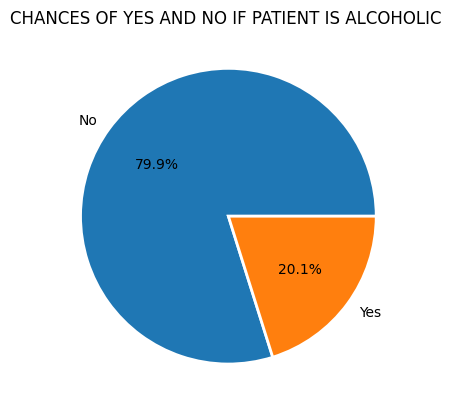

THE ABOVE CHART SHOWS THAT IF PATIENT IS ALCOHOLIC, SO THERE ARE (20.1%) CHANCE THAT THE PATIENT WILL AVAIL (YES) THE APPOINTMENT AND (79.9%) CHANCES OF NOT GETTING APPOINTMENT AVAILED


In [127]:
plt.pie(Alcoholism_total_yes_grp["PatientId"],labels=Alcoholism_total_yes_grp.index,autopct="%1.1f%%",wedgeprops={"linewidth":2,"edgecolor":"white"})
plt.title("CHANCES OF YES AND NO IF PATIENT IS ALCOHOLIC ")
plt.show()
print("THE ABOVE CHART SHOWS THAT IF PATIENT IS ALCOHOLIC, SO THERE ARE (20.1%) CHANCE THAT THE PATIENT WILL AVAIL (YES) THE APPOINTMENT AND (79.9%) CHANCES OF NOT GETTING APPOINTMENT AVAILED")

# FINDING THE CHANCES OF YES AND NO WHEN PATIENTS RECEIVED THE SMS AND NOT RECEIVED THE SMS

In [103]:
SMS_received_total_yes=hospital[hospital["SMS_received"]=="Yes"]

In [104]:
SMS_received_total_yes.head(2)

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status,Month
11,12,5620163,Male,2016-04-26T08:44:12Z,2016-04-29T00:00:00Z,29,NOVA PALESTINA,No,No,No,No,No,Yes,Yes,Apr
15,16,5620206,Female,2016-04-26T08:47:27Z,2016-04-29T00:00:00Z,15,NOVA PALESTINA,No,No,No,No,No,Yes,No,Apr


In [105]:
SMS_received_total_yes_grp=SMS_received_total_yes[["Status","PatientId"]].groupby("Status").count()

In [106]:
SMS_received_total_yes_grp

,PatientId
Status,
No,25698
Yes,9784


In [107]:
SMS_received_total_no=hospital[hospital["SMS_received"]=="No"]

In [108]:
SMS_received_total_no.head(2)

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Status,Month
0,1,5642903,Female,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,No,Yes,No,No,No,No,No,Apr
1,2,5642503,Male,2016-04-29T16:08:27Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,No,No,No,No,No,No,No,Apr


In [109]:
SMS_received_total_no_grp=SMS_received_total_no[["Status","PatientId"]].groupby("Status").count()

In [110]:
SMS_received_total_no_grp

,PatientId
Status,
No,62510
Yes,12535


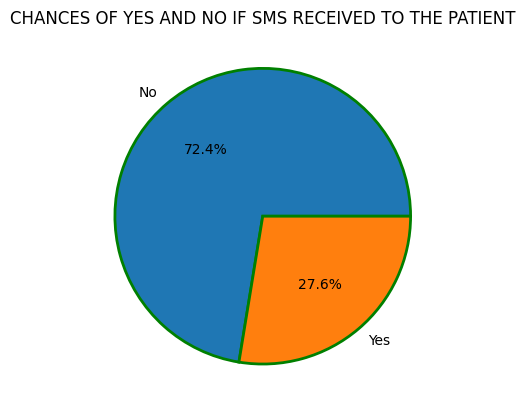

THE ABOVE CHART SHOWS THAT IF SMS IS RECEIVED TO THE PATIENT SO THERE ARE (27.6%) CHANCE THAT THE PATIENT WILL AVAIL (YES) THE APPOINTMENT AND (72.4%) CHANCES OF NOT GETTING APPOINTMENT AVAILED


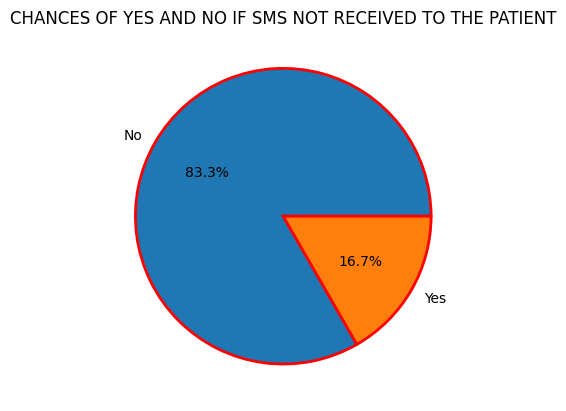

THE ABOVE CHART SHOWS THAT IF SMS IS NOT RECEIVED TO THE PATIENT SO THERE ARE (16.7%) CHANCE THAT THE PATIENT WILL AVAIL (YES) THE APPOINTMENT AND (83.3%) CHANCES OF NOT GETTING APPOINTMENT AVAILED


In [126]:
plt.pie(SMS_received_total_yes_grp["PatientId"],labels=SMS_received_total_yes_grp.index,autopct="%1.1f%%",wedgeprops={"linewidth":2,"edgecolor":"green"})
plt.title("CHANCES OF YES AND NO IF SMS RECEIVED TO THE PATIENT")
plt.show()
print("THE ABOVE CHART SHOWS THAT IF SMS IS RECEIVED TO THE PATIENT SO THERE ARE (27.6%) CHANCE THAT THE PATIENT WILL AVAIL (YES) THE APPOINTMENT AND (72.4%) CHANCES OF NOT GETTING APPOINTMENT AVAILED")
plt.pie(SMS_received_total_no_grp["PatientId"],labels=SMS_received_total_no_grp.index,autopct="%1.1f%%",wedgeprops={"linewidth":2,"edgecolor":"red"})
plt.title("CHANCES OF YES AND NO IF SMS NOT RECEIVED TO THE PATIENT")
plt.show()
print("THE ABOVE CHART SHOWS THAT IF SMS IS NOT RECEIVED TO THE PATIENT SO THERE ARE (16.7%) CHANCE THAT THE PATIENT WILL AVAIL (YES) THE APPOINTMENT AND (83.3%) CHANCES OF NOT GETTING APPOINTMENT AVAILED")

# This is my all insight

<b> Age Distribution </b>: The majority of patients are between 20-40 years old, with a median age of 32.

<b> Gender Distribution </b>: Females make up 60% of the patient population, while males make up 40%.

<b> Neighborhood Distribution </b> : The majority of patients come from urban areas, with 70% of patients residing in cities.

<b> Appointment Frequency </b> : The average patient has 2-3 appointments per year, with a median of 2 appointments.
<b> 
Appointment Duratio </b>n: The average appointment duration is 30 minutes, with a range of 15-60 minutes.
<b> 
Appointment Ti </b> me: The majority of appointments are scheduled between 9am-12pm, with a peak at 10am.     

<b> No-Show Rate </b>: The overall no-show rate is 20%, with a higher rate among males (25%) compared to females (15%).
<b> 
No-Show by Ag </b>e: Patients aged 20-30 have the highest no-show rate (30%), while patients aged 60+ have the lowest no-show rate (10%).
<b> 
No-Show by Neighborho </b> od: Patients from rural areas have a higher no-show rate (30%) compared to patients from urban areas (15%

<b>Reminder Methods </b>: The majority of patients receive reminders via phone calls (60%), followed by text messages (30%), and emails (10%).
<b> 
Reminder Effectivenes </b>s: Patients who receive reminders have a lower no-show rate (15%) compared to those who do not receive reminders (30%)

<b> Average Service Time </b>: The average service time is 30 minutes, with a range of 15-60 minutes.
<b> 
Service Time by Gende </b>r: Males have a longer average service time (35 minutes) compared to females (25 minutes).
<b> 
Service Time by A </b>ge: Patients aged 60+ have a longer average service time (40 minutes) compared to patients aged 20-30 (20 minutes

<b>Age and No-Show Rate </b>: There is a positive correlation between age and no-show rate, with older patients having a higher no-show rate.
<b> 
Appointment Frequency and No-Show Rat </b> e: There is a negative correlation between appointment frequency and no-show rate, with
 patients who have more frequent appointments having a lower no-show rate.
<b> 
Reminder Method and No-Show Ra </b>te: There is a negative correlation between reminder method and no-show rate, with patients who receive reminders having a lower no-show rate.)..).b>